# Updated Rubbish Classifier

This project is based on the [Rubbish Classifier with CNN (TinyVGG)](https://github.com/Jotadebeese/rubbish_classifier) which was an early implementation to try out a CNN for rubbish classification.

The idea is to improve the past version by using a ViT (Vision Transformer) model, in specific the [vit-base-patch16-224-in21k](https://huggingface.co/google/vit-base-patch16-224-in21k) from google and **Fine-Tuned** it for image classification using the [trashnet](https://github.com/garythung/trashnet) dataset which consists of six classes: glass, paper, cardboard, plastic, metal, and trash.

The dataset consists of 5054 images.

In [1]:
#!pip install datasets
#!pip install transformers

## Loading Dataset and Data exploring

First, we need to load the dataset and have a look its labels and some of the images in it to have a better picture of the data we will be using to Fine-Tune.

In [21]:
# Loading dataset

from datasets import load_dataset

dataset = load_dataset("ethanwan/trash_classification")
dataset

Resolving data files: 100%|██████████| 68/68 [00:00<00:00, 75.08it/s]


DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 456
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 133
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 68
    })
})

In [23]:
# Looking at one example from the dataset.

example = dataset['train'][100]
example


{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=224x224>,
 'label': 1}

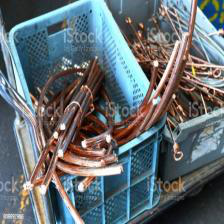

In [24]:
# Displaying the image

image = example['image']
image

In [25]:
# Getting labels from dataset

labels = dataset['train'].features['label']
labels

ClassLabel(names=['glass', 'metal', 'organic_food_waste', 'paper_cardboard', 'plastic'], id=None)

In [26]:
# Getting label of exmaple from before.

labels.int2str(example['label'])

'metal'

The following is a function to display a grid of examples to have a better idea of the data.

In [27]:
# Function to display a grid of examples

# import random
# from PIL import ImageDraw, ImageFont, Image

# def display_examples(ds, seed: int = 1, examples_per_class: int = 3, size=(350,350)):

#     w, h = size
#     labels = ds['train'].features['label'].names
#     grid = Image.new('RGB', size=(examples_per_class * w, len(labels) * h))
#     draw = ImageDraw.Draw(grid)

#     for label_id, label in enumerate(labels):

#         # Filter dataset by single label, shuffle it and grab few examples
#         ds_slice = ds['train'].filter(lambda ex: ex['label'] == label_id).shuffle(seed).select(range(examples_per_class))

#         # Plot labels examples in a row
#         for i, example in enumerate(ds_slice):
#             image = example['image']
#             idx = examples_per_class * label_id + i
#             box = (idx % examples_per_class * w, idx // examples_per_class * h)
#             grid.paste(image.resize(size), box=box)
#             draw.text(box, label, (255, 255, 255))

#     return grid

# display_examples(dataset, seed=random.randint(0, 2527), examples_per_class=3)

## ViT Feature Extractor

We need to make sure we apply the correct transformations on our images using the same transformations that were used to train the ViT model we want to use. For that we use a [ViTFeatureExtractor](https://huggingface.co/docs/transformers/model_doc/vit#transformers.ViTFeatureExtractor) to extract the features from the pretrained model.

In [28]:
from transformers import ViTImageProcessor

model_name_or_path = 'google/vit-base-patch16-224-in21k'
feature_extractor = ViTImageProcessor(model_name_or_path)
feature_extractor

ViTImageProcessor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": "google/vit-base-patch16-224-in21k",
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [29]:
# Processing an image by passing it to the feature extractor's call function
feature_extractor(image, return_tensors='pt')

{'pixel_values': tensor([[[[-0.7647, -0.7569, -0.7490,  ..., -0.9059, -0.9294, -0.7961],
          [-0.7647, -0.7569, -0.7569,  ..., -0.8745, -0.8745, -0.7333],
          [-0.7725, -0.7569, -0.7569,  ..., -0.8431, -0.7725, -0.5843],
          ...,
          [-0.0745, -0.0118,  0.3647,  ..., -0.4431, -0.4353, -0.4431],
          [-0.0588,  0.0275,  0.4588,  ..., -0.4588, -0.4588, -0.4510],
          [-0.1294,  0.0039,  0.4431,  ..., -0.4667, -0.4588, -0.4510]],

         [[-0.7647, -0.7569, -0.7569,  ..., -0.5216, -0.3569, -0.0667],
          [-0.7647, -0.7569, -0.7490,  ..., -0.5529, -0.3961, -0.1059],
          [-0.7569, -0.7569, -0.7569,  ..., -0.5686, -0.4039, -0.1137],
          ...,
          [-0.0745, -0.0275,  0.3490,  ..., -0.3647, -0.3569, -0.3647],
          [-0.0745,  0.0118,  0.4353,  ..., -0.3804, -0.3804, -0.3725],
          [-0.1451, -0.0039,  0.4196,  ..., -0.3882, -0.3804, -0.3725]],

         [[-0.7804, -0.7725, -0.7882,  ..., -0.0824, -0.2235, -0.2157],
          [-0

## Processing the Dataset

Now it is time to apply the transformations to our data. To do so, we can create a function to apply `feature_extractor` to every image in the dataset.

In [42]:
# function to trnasform a batch of data

def transform(batch):
    # Take a list of PIL images and turn them to pixel values
    inputs = feature_extractor([x for x in batch['image']], return_tensors='pt')

    # Including labels
    inputs['labels'] = batch['label']
    return inputs

In [43]:
prepared_ds = dataset.with_transform(transform=transform)

In [44]:
prepared_ds['train'][0:2]

{'pixel_values': tensor([[[[-0.9922, -0.9922, -0.9922,  ..., -1.0000, -1.0000, -1.0000],
          [-0.9922, -0.9922, -0.9922,  ..., -1.0000, -1.0000, -1.0000],
          [-0.9922, -0.9922, -0.9922,  ..., -1.0000, -1.0000, -1.0000],
          ...,
          [ 0.0039, -0.1922, -0.1294,  ...,  0.0510,  0.0275,  0.0039],
          [-0.1843, -0.1765,  0.1843,  ...,  0.0118,  0.0039, -0.0039],
          [-0.0902, -0.0902,  0.1294,  ..., -0.0431, -0.0353, -0.0275]],

         [[-0.3255, -0.3255, -0.3255,  ..., -0.3961, -0.4039, -0.4039],
          [-0.3255, -0.3255, -0.3255,  ..., -0.3961, -0.4039, -0.4039],
          [-0.3255, -0.3255, -0.3255,  ..., -0.3961, -0.4039, -0.4039],
          ...,
          [ 0.3569,  0.1608,  0.2235,  ...,  0.4118,  0.3882,  0.3647],
          [ 0.1765,  0.1843,  0.5451,  ...,  0.3725,  0.3569,  0.3490],
          [ 0.2706,  0.2706,  0.4902,  ...,  0.3098,  0.3176,  0.3255]],

         [[-0.5529, -0.5529, -0.5529,  ..., -0.5843, -0.5922, -0.5922],
          [-0

## Training and Evaluation


### Define data collator

Batches come in as lists of cits, so we can just unpack and then stack into batch tensors.

In [45]:
import torch

def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['labels'] for x in batch])
    }

### Define evaluation metric

The [accuracy](https://huggingface.co/spaces/evaluate-metric/accuracy) metric from `datasets` can be used to compare predictions againts labels.

In [46]:
#!pip install evaluate

In [47]:
import numpy as np
import evaluate

accuracy_metric = evaluate.load('accuracy')
def compute_metrics(p):
    return accuracy_metric.compute(predictions=np.argmax(p.predictions, axis=1), references=p.label_ids)

### Loading pretrained model

In [48]:
from transformers import ViTForImageClassification

labels = dataset['train'].features['label'].names

model = ViTForImageClassification.from_pretrained(
    model_name_or_path,
    num_labels=len(labels),
    id2label={str(i): c for i, c in enumerate(labels)},
    label2id={c: str(i) for i, c in enumerate(labels)}
)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### Train Configuration

In [49]:
#!pip install transformers[torch]
#!pip install accelerate -U

In [50]:
from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir="./vit-base-rubbish",
    per_device_train_batch_size=16,
    evaluation_strategy="steps",
    num_train_epochs=4,
    fp16=True,
    save_steps=100,
    eval_steps=100,
    logging_steps=10,
    learning_rate=2e-4,
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=False,
    report_to='tensorboard',
    load_best_model_at_end=True,
)

In [51]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=prepared_ds["train"],
    eval_dataset=prepared_ds["validation"],
    tokenizer=feature_extractor,
)

## Train

In [52]:
train_results = trainer.train()
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

                                       
  0%|          | 0/116 [00:31<?, ?it/s]         

{'loss': 1.5064, 'learning_rate': 0.00018275862068965518, 'epoch': 0.34}


                                       
  0%|          | 0/116 [00:36<?, ?it/s]         

{'loss': 1.2263, 'learning_rate': 0.00016551724137931035, 'epoch': 0.69}


                                       
  0%|          | 0/116 [00:40<?, ?it/s]         

{'loss': 0.9787, 'learning_rate': 0.00014827586206896554, 'epoch': 1.03}


                                       
  0%|          | 0/116 [00:44<?, ?it/s]         

{'loss': 0.6207, 'learning_rate': 0.00013103448275862068, 'epoch': 1.38}


                                       
  0%|          | 0/116 [00:48<?, ?it/s]         

{'loss': 0.4919, 'learning_rate': 0.00011379310344827588, 'epoch': 1.72}


                                       
  0%|          | 0/116 [00:53<?, ?it/s]         

{'loss': 0.4612, 'learning_rate': 9.655172413793105e-05, 'epoch': 2.07}


                                       
  0%|          | 0/116 [00:57<?, ?it/s]         

{'loss': 0.2145, 'learning_rate': 7.931034482758621e-05, 'epoch': 2.41}


                                       
  0%|          | 0/116 [01:01<?, ?it/s]         

{'loss': 0.164, 'learning_rate': 6.206896551724138e-05, 'epoch': 2.76}


                                       
  0%|          | 0/116 [01:05<?, ?it/s]         

{'loss': 0.1216, 'learning_rate': 4.482758620689655e-05, 'epoch': 3.1}


                                       
  0%|          | 0/116 [01:10<?, ?it/s]          

{'loss': 0.1, 'learning_rate': 2.7586206896551727e-05, 'epoch': 3.45}
















                                       

                                         
  0%|          | 0/116 [01:12<?, ?it/s]          



{'eval_loss': 0.6262155771255493, 'eval_accuracy': 0.7669172932330827, 'eval_runtime': 2.366, 'eval_samples_per_second': 56.213, 'eval_steps_per_second': 7.185, 'epoch': 3.45}


                                       
  0%|          | 0/116 [01:18<?, ?it/s]          

{'loss': 0.0893, 'learning_rate': 1.0344827586206897e-05, 'epoch': 3.79}


                                       
100%|██████████| 116/116 [00:58<00:00,  2.00it/s]


{'train_runtime': 58.0575, 'train_samples_per_second': 31.417, 'train_steps_per_second': 1.998, 'train_loss': 0.5197104914435025, 'epoch': 4.0}
***** train metrics *****
  epoch                    =        4.0
  train_loss               =     0.5197
  train_runtime            = 0:00:58.05
  train_samples_per_second =     31.417
  train_steps_per_second   =      1.998


## Evaluate

In [53]:
metrics = trainer.evaluate(prepared_ds['validation'])
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

100%|██████████| 17/17 [00:02<00:00,  6.79it/s]

***** eval metrics *****
  epoch                   =        4.0
  eval_accuracy           =     0.7669
  eval_loss               =     0.6262
  eval_runtime            = 0:00:02.96
  eval_samples_per_second =     44.823
  eval_steps_per_second   =      5.729


## Inference

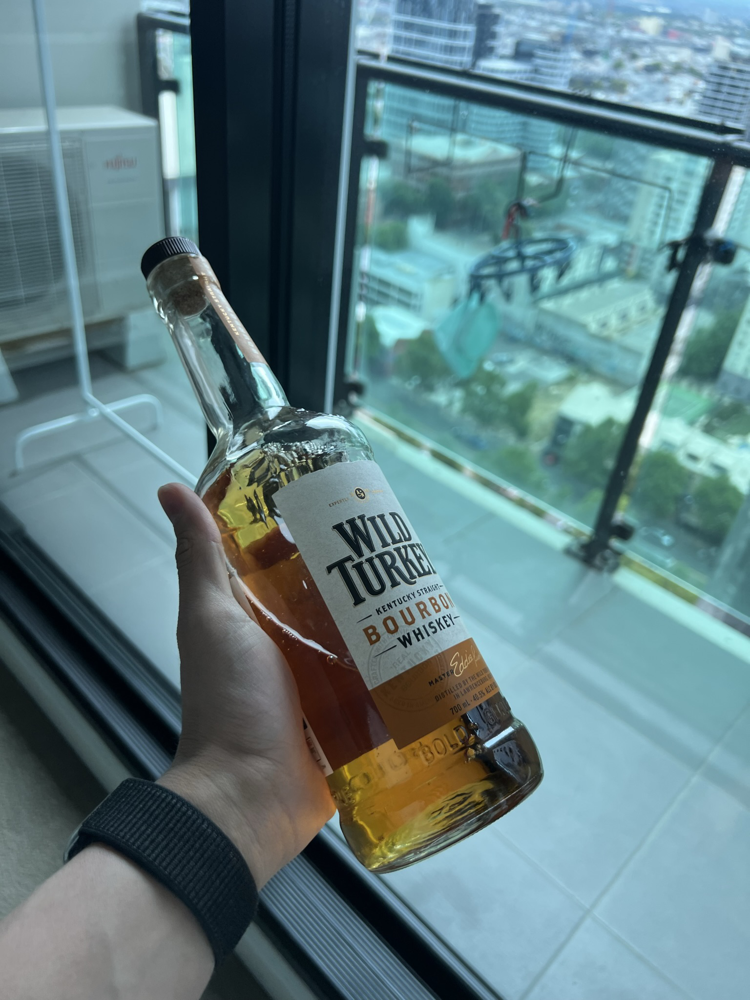

[{'score': 0.6767911314964294, 'label': 'glass'},
 {'score': 0.13518564403057098, 'label': 'metal'},
 {'score': 0.1054067462682724, 'label': 'organic_food_waste'},
 {'score': 0.04893597215414047, 'label': 'plastic'},
 {'score': 0.033680520951747894, 'label': 'paper_cardboard'}]

In [56]:
from transformers import pipeline
from IPython.display import display
from PIL import Image

image = 'bottle.JPEG'
display(Image.open(image))

classifier = pipeline("image-classification", model="vit-base-rubbish")
classifier(image)

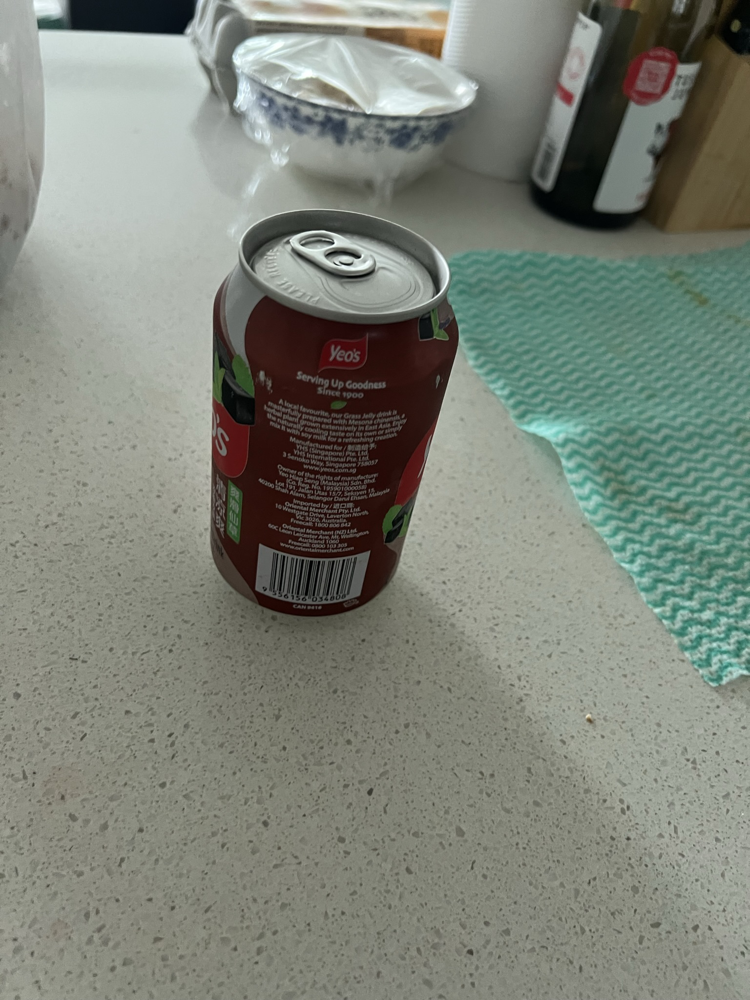

[{'score': 0.4392419755458832, 'label': 'metal'},
 {'score': 0.41723260283470154, 'label': 'glass'},
 {'score': 0.05802527442574501, 'label': 'organic_food_waste'},
 {'score': 0.04407494142651558, 'label': 'paper_cardboard'},
 {'score': 0.04142528027296066, 'label': 'plastic'}]

In [58]:
image = 'can.jpg'
display(Image.open(image))

classifier(image)

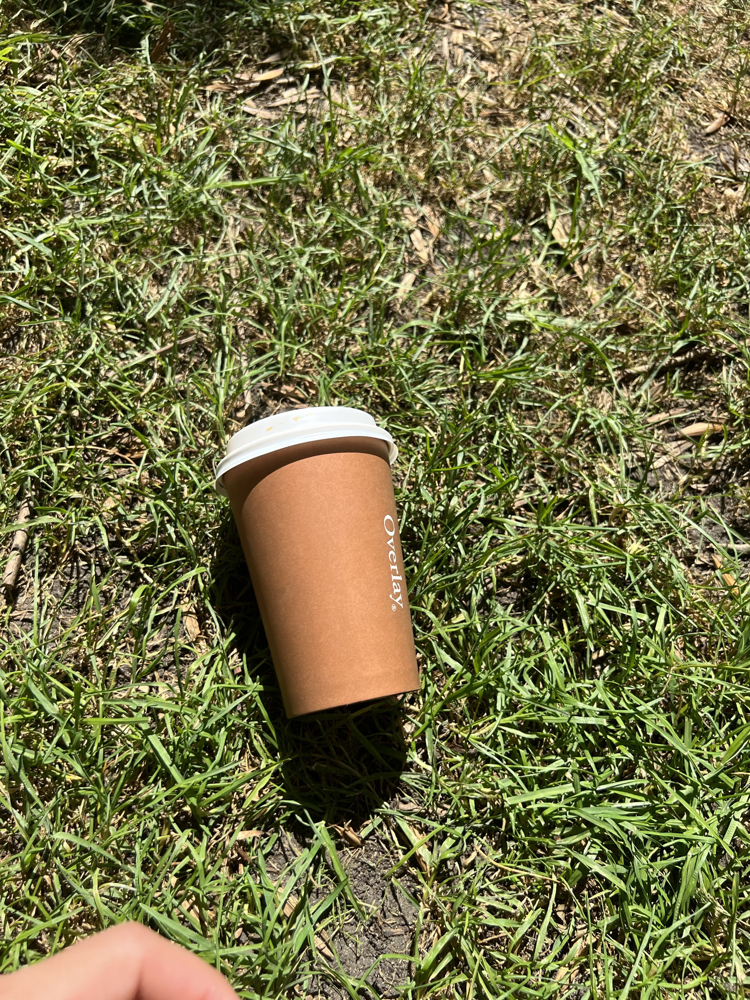

[{'score': 0.7627668976783752, 'label': 'organic_food_waste'},
 {'score': 0.09232798963785172, 'label': 'metal'},
 {'score': 0.067337267100811, 'label': 'plastic'},
 {'score': 0.051909882575273514, 'label': 'glass'},
 {'score': 0.02565796487033367, 'label': 'paper_cardboard'}]

In [59]:
image = 'coffee-cup.JPEG'
display(Image.open(image))

classifier(image)

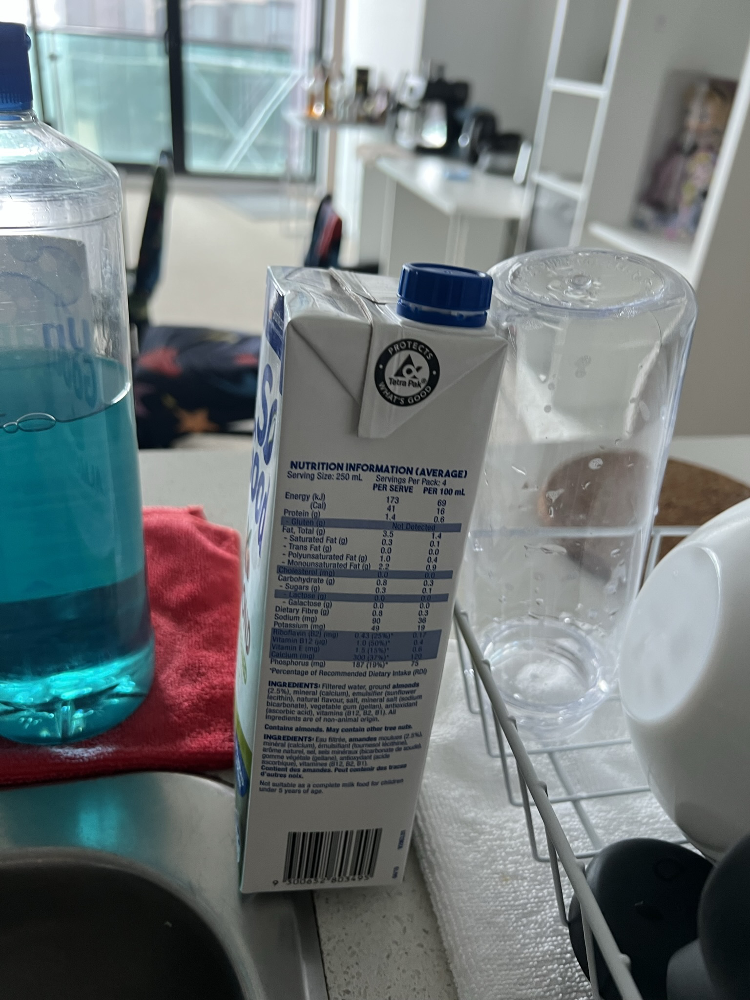

[{'score': 0.7792355418205261, 'label': 'plastic'},
 {'score': 0.1321929395198822, 'label': 'glass'},
 {'score': 0.033824484795331955, 'label': 'metal'},
 {'score': 0.029683716595172882, 'label': 'paper_cardboard'},
 {'score': 0.02506331168115139, 'label': 'organic_food_waste'}]

In [60]:
image = 'milk-box.JPEG'
display(Image.open(image))

classifier(image)